In [3]:
import numpy as np
import os 
import pandas as pd
#from pandas_profiling import ProfileReport
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import ensemble, tree, linear_model
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from scipy.stats import pearsonr
import pyodbc
import seaborn as sns

import re
from scipy import stats
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import ks_2samp
from scipy.stats import norm
#import missingno as msno
import warnings
import datetime
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
import nltk
#nltk.download('popular')
nltk.download('punkt')
nltk.download('wordnet')
import scipy.stats as stats

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [4]:
path = r"C:\Users\eitanb\Documents\GitHub\ML_Football_DS18\DATA"
path_result = r"C:\Users\eitanb\Documents\GitHub\ML_Football_DS18\result"

In [5]:
df_team=pd.read_csv(path+"/"+"team_results.csv")

In [6]:
df=df_team.copy()

In [7]:


def convert_categorical(df, threshold=10):
    """
    Convert columns with unique values less than threshold to 'category' dtype.
    """
    for col in df.columns:
        if df[col].nunique() < threshold:
            df[col] = df[col].astype('category')
    return df

def check_missing_values(df):
    """
    Generate a report of missing values in the dataset.
    """
    missing_values = df.isnull().sum()
    missing_values = missing_values[missing_values > 0].reset_index()
    missing_values.columns = ["Column", "Missing Values"]
    return missing_values

def check_duplicates(df):
    """
    Count the number of duplicate rows in the dataset.
    """
    return df.duplicated().sum()

def generate_summary_statistics(df):
    """
    Generate summary statistics for numerical columns.
    """
    return df.describe().T

def plot_distributions(df, cols):
    """
    Plot histograms for given numerical columns.
    """
    fig, axes = plt.subplots(1, len(cols), figsize=(6 * len(cols), 5))
    for i, col in enumerate(cols):
        sns.histplot(df[col], bins=20, kde=True, ax=axes[i])
        axes[i].set_title(f"Distribution of {col}")
    plt.show()

def plot_correlation_heatmap(df):
    """
    Generate a heatmap showing correlations among numerical features.
    """
    plt.figure(figsize=(12, 8))
    sns.heatmap(df.select_dtypes(include=[np.number]).corr(), cmap="coolwarm", annot=False, linewidths=0.5)
    plt.title("Correlation Heatmap")
    plt.show()

def chi_square_test(df, col1, col2):
    """
    Perform a Chi-Square test for independence between two categorical columns.
    """
    contingency_table = pd.crosstab(df[col1], df[col2])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    return {"Chi2 Statistic": chi2, "p-value": p}

def t_test(df, numerical_col, categorical_col, group1, group2):
    """
    Perform a T-Test between two groups of a categorical variable on a numerical variable.
    """
    group1_data = df[df[categorical_col] == group1][numerical_col]
    group2_data = df[df[categorical_col] == group2][numerical_col]
    group3_data = df[df[categorical_col] == group3][numerical_col]
    t_stat, p_value = ttest_ind(group1_data, group2_data,group3_data, equal_var=False)
    return {"T-Statistic": t_stat, "p-value": p_value}

def ks_test(df, numerical_col, categorical_col, group1, group2):
    """
    Perform a Kolmogorov-Smirnov test to compare the distributions of a numerical variable between two groups.
    """
    group1_data = df[df[categorical_col] == group1][numerical_col]
    group2_data = df[df[categorical_col] == group2][numerical_col]
    ks_stat, p_value = ks_2samp(group1_data, group2_data)
    return {"KS Statistic": ks_stat, "p-value": p_value}




In [8]:
# change result_h to category
df['result'] = df['result_h'].map({'W': 2, 'D': 1, 'L': 0})

In [9]:
# add random of missing data
def introduce_nan(df, columns, fraction=0.05, random_state=None):
    """
    Introduce NaN values in random locations in specified columns.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    columns (list): List of column names to introduce NaN values.
    fraction (float): The fraction of values to replace with NaN (default: 0.1).
    random_state (int): Seed for reproducibility (optional).

    Returns:
    pd.DataFrame: DataFrame with NaN values introduced.
    """
    df_copy = df.copy()
    np.random.seed(random_state)
    
    for col in columns:
        num_nan = int(len(df) * fraction)  # Number of NaNs to introduce
        nan_indices = np.random.choice(df.index, num_nan, replace=False)
        df_copy.loc[nan_indices, col] = np.nan
    
    return df_copy
#df = introduce_nan(df_work, columns=['xGoals_h', 'xGoals_a','deep_h','deep_a'], fraction=0.05, random_state=42)

In [10]:
df.head()

,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a,result_h,game_year,game_month,game_day,result
0,81,1,2015,8/8/2015 15:45,89,82,1,0,1,0,0.627539,9,1,4,13.8261,12,1,2.0,0,0,0,0,0.284979,5,1.396328,0.994160,4.0,1.0,0.674600,9,4,10,8.2188,12,2,3,0,0,1,0,0.586365,7,1.745371,0.811549,3.0,4.0,W,2015,8,8,2
1,82,1,2015,8/8/2015 18:00,73,71,0,1,0,0,0.876106,11,2,11,6.9000,13,6,3.0,0,0,0,0,0.419975,9,2.159510,1.170894,2.0,2.0,0.782253,7,3,2,11.8462,13,3,4,0,1,0,1,0.560695,4,1.238205,0.736815,2.0,2.0,L,2015,8,8,0
2,83,1,2015,8/8/2015 18:00,72,90,2,2,0,1,0.604226,10,5,5,6.6500,7,8,1.0,0,2,0,2,0.549139,8,1.025550,0.493522,2.0,3.0,0.557892,11,5,4,17.1579,13,2,2,0,2,0,1,0.418385,8,1.959323,1.030588,3.0,3.0,D,2015,8,8,1
3,84,1,2015,8/8/2015 18:00,75,77,4,2,3,0,2.568030,19,8,5,10.8800,13,6,2.0,0,4,0,2,1.727543,18,6.815649,3.741916,4.0,4.0,1.459460,11,5,6,9.5556,17,3,4,0,2,0,2,1.288886,9,7.622863,5.617276,2.0,3.0,W,2015,8,8,2
4,85,1,2015,8/8/2015 18:00,79,78,1,3,0,1,1.130760,17,6,5,5.7368,14,1,1.0,0,1,0,1,0.416638,12,1.966623,0.699249,3.0,4.0,2.109750,11,7,10,10.6250,20,4,0,0,3,0,3,2.050685,10,10.799517,8.554974,2.0,4.0,L,2015,8,8,0


In [11]:
df.shape

(12680, 51)

In [12]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 51 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gameID                 12680 non-null  int64  
 1   leagueID               12680 non-null  int64  
 2   season                 12680 non-null  int64  
 3   date                   12680 non-null  object 
 4   homeTeamID             12680 non-null  int64  
 5   awayTeamID             12680 non-null  int64  
 6   homeGoals              12680 non-null  int64  
 7   awayGoals              12680 non-null  int64  
 8   homeGoalsHalfTime      12680 non-null  int64  
 9   awayGoalsHalfTime      12680 non-null  int64  
 10  xGoals_h               12680 non-null  float64
 11  shots_h                12680 non-null  int64  
 12  shotsOnTarget_h        12680 non-null  int64  
 13  deep_h                 12680 non-null  int64  
 14  ppda_h                 12680 non-null  float64
 15  fo

## Data Protocol 

#### Exporting results to the protocol

In [13]:
import pandas as pd

# Define the file path
file_path = path_result + "/Football_data_protocol.xlsx"

with pd.ExcelWriter(file_path) as writer:
    df.dtypes.to_frame(name="Data Type").to_excel(writer, sheet_name="data_type")  # Convert dtype Series to DataFrame
    df.max().to_frame(name="Max Values").to_excel(writer, sheet_name="max")  # Convert max Series to DataFrame
    df.min().to_frame(name="Min Values").to_excel(writer, sheet_name="min")  # Convert min Series to DataFrame
    df.isnull().sum().to_frame(name="NAN Count").to_excel(writer, sheet_name="NAN")  # Get count of NaN values
    df.nunique().to_frame(name="Unique Values").to_excel(writer, sheet_name="unique")  # Unique value count


#### categories, numeric and dummy

In [14]:
def convert_categorical(df, threshold=10):
    """
    Convert columns with unique values less than threshold to 'category' dtype.
    """
    for col in df.columns:
        if df[col].nunique() < threshold:
            df[col] = df[col].astype('category')
    return df


In [15]:
# categories
df=convert_categorical(df, threshold=10)
categorical_columns=["season", "leagueID","game_year", "game_month","game_day",'awayGoals','homeGoals','teamgoals_a', 'teamgoals_h', 'yellowCards_a']
# Convert to categorical
df[categorical_columns] = df[categorical_columns].astype("category")

# Filter out the categorical columns
categorical_df = df.select_dtypes(include=['category'])

In [16]:
# Get all numeric columns
df_num = df.select_dtypes(include=['number']).columns.dropna().unique()

# Drop specific ID columns (if they exist)
df_num = df_num.difference(['gameID', 'homeTeamID', 'awayTeamID'])

In [17]:
df_num

Index(['corners_a', 'corners_h', 'deep_a', 'deep_h', 'fouls_a', 'fouls_h',
       'ppda_a', 'ppda_h', 'shotsOnTarget_a', 'shotsOnTarget_h', 'shots_a',
       'shots_h', 'total_blocked_shots_a', 'total_blocked_shots_h',
       'total_key_passes_a', 'total_key_passes_h', 'total_saved_shots_a',
       'total_saved_shots_h', 'total_xAssists_a', 'total_xAssists_h',
       'total_xGoalsBuildup_a', 'total_xGoalsBuildup_h', 'total_xGoalsChain_a',
       'total_xGoalsChain_h', 'xGoals_a', 'xGoals_h'],
      dtype='object')

## Descriptive Statistics

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (12680, 50)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  14
    Number of Integer-Categorical Columns =  14
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  20
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  1
    Numbe

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,100,81.000000,16135.000000,Possible ID column: drop before modeling step.
leagueID,category,0.000000,0,,,No issue
season,category,0.000000,0,,,No issue
date,object,0.000000,53,,,No issue
homeTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
awayTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
homeGoals,category,0.000000,0,,,"5 rare categories: [6, 7, 8, 9, 10]. Group them into a single category or drop the categories."
awayGoals,category,0.000000,0,,,"5 rare categories: [5, 6, 7, 8, 9]. Group them into a single category or drop the categories."
homeGoalsHalfTime,category,0.000000,0,,,"3 rare categories: [4, 5, 6]. Group them into a single category or drop the categories."
awayGoalsHalfTime,category,0.000000,0,,,"2 rare categories: [4, 5]. Group them into a single category or drop the categories."


Number of All Scatter Plots = 105


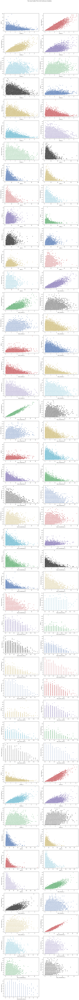

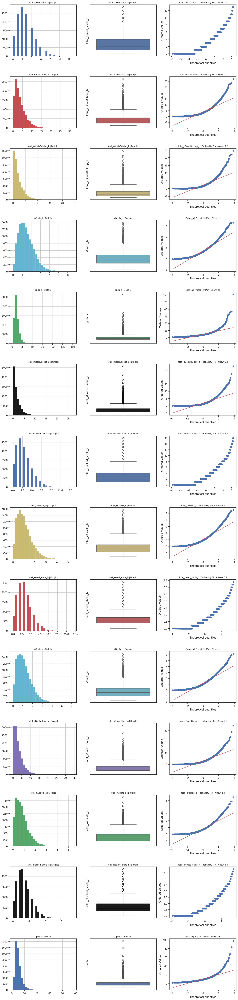

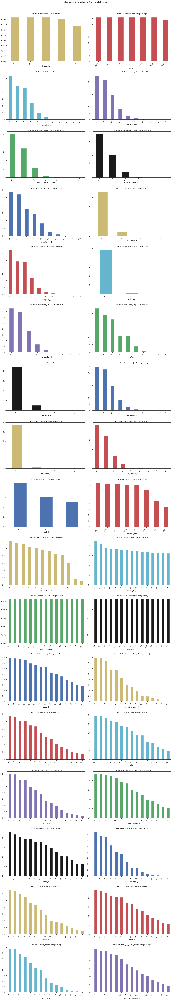

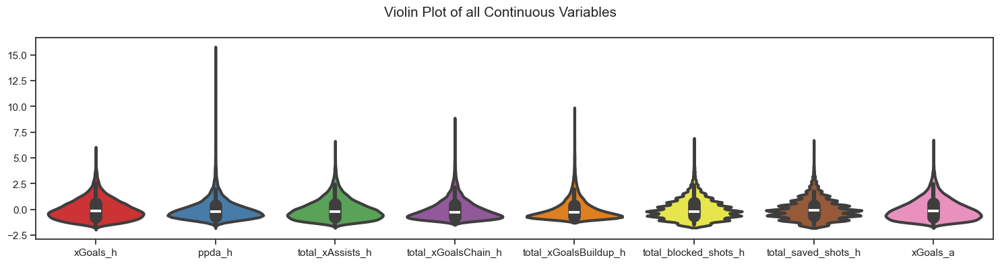

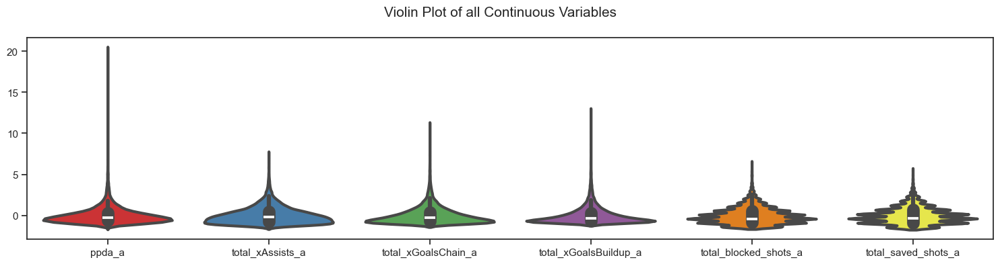

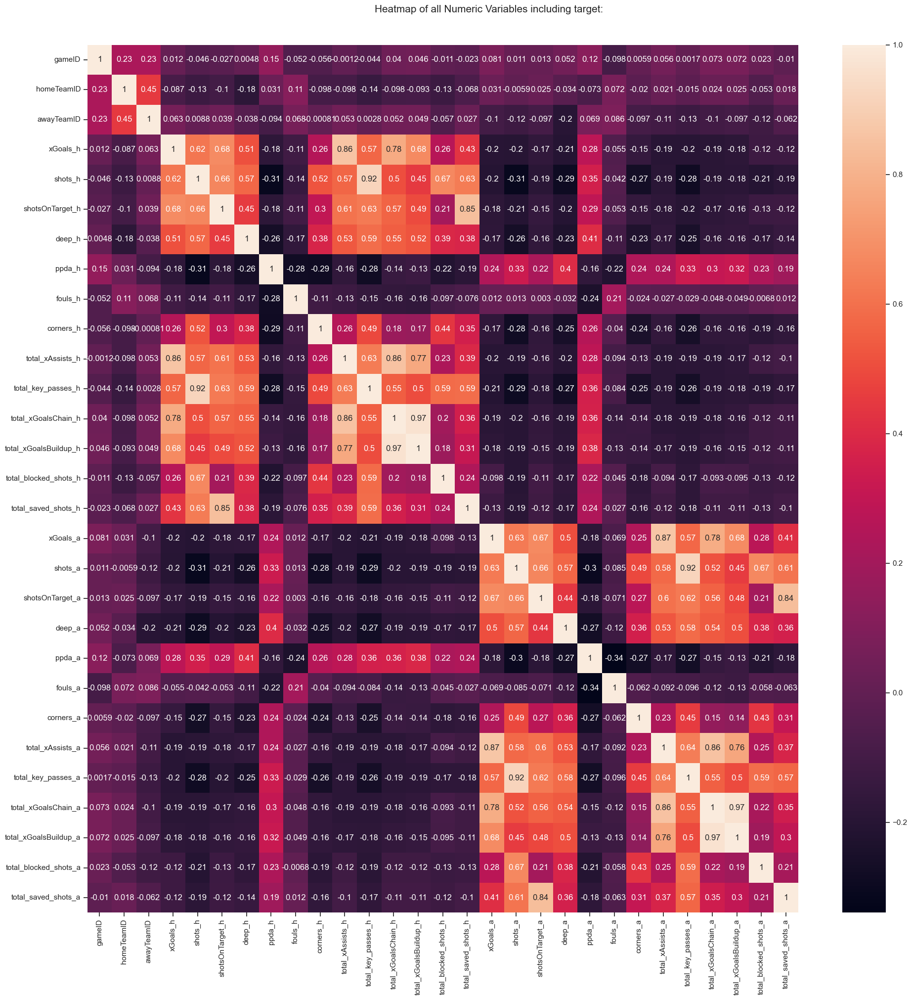

ValueError: Image size of 2000x119000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 2000x119000 with 476 Axes>

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_dat

Could not draw wordcloud plot for date. We need at least 1 word to plot a word cloud, got 0.
All Plots done
Time to run AutoViz = 51 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a,result_h,game_year,game_month,game_day
0,81,1,2015,8/8/2015 15:45,89,82,1,0,1,0,0.627539,9,1,4,13.8261,12,1,2.0,0,0,0,0,0.284979,5,1.396328,0.994160,4.0,1.0,0.674600,9,4,10,8.2188,12,2,3,0,0,1,0,0.586365,7,1.745371,0.811549,3.0,4.0,W,2015,8,8
1,82,1,2015,8/8/2015 18:00,73,71,0,1,0,0,0.876106,11,2,11,6.9000,13,6,3.0,0,0,0,0,0.419975,9,2.159510,1.170894,2.0,2.0,0.782253,7,3,2,11.8462,13,3,4,0,1,0,1,0.560695,4,1.238205,0.736815,2.0,2.0,L,2015,8,8
2,83,1,2015,8/8/2015 18:00,72,90,2,2,0,1,0.604226,10,5,5,6.6500,7,8,1.0,0,2,0,2,0.549139,8,1.025550,0.493522,2.0,3.0,0.557892,11,5,4,17.1579,13,2,2,0,2,0,1,0.418385,8,1.959323,1.030588,3.0,3.0,D,2015,8,8
3,84,1,2015,8/8/2015 18:00,75,77,4,2,3,0,2.568030,19,8,5,10.8800,13,6,2.0,0,4,0,2,1.727543,18,6.815649,3.741916,4.0,4.0,1.459460,11,5,6,9.5556,17,3,4,0,2,0,2,1.288886,9,7.622863,5.617276,2.0,3.0,W,2015,8,8
4,85,1,2015,8/8/2015 18:00,79,78,1,3,0,1,1.130760,17,6,5,5.7368,14,1,1.0,0,1,0,1,0.416638,12,1.966623,0.699249,3.0,4.0,2.109750,11,7,10,10.6250,20,4,0,0,3,0,3,2.050685,10,10.799517,8.554974,2.0,4.0,L,2015,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12675,16131,5,2020,5/23/2021 19:00,168,166,1,2,1,1,1.411190,15,5,17,12.3684,8,9,2.0,0,1,0,1,0.971853,11,3.853730,1.999150,6.0,4.0,1.707510,8,5,3,8.3529,11,5,2,0,2,0,1,0.307960,4,1.223212,0.715843,1.0,3.0,L,2021,5,23
12676,16132,5,2020,5/23/2021 19:00,177,176,1,2,1,1,1.198190,10,3,3,16.2632,11,5,1.0,0,1,0,1,0.855524,8,1.962812,1.028432,3.0,2.0,1.238050,12,5,4,27.0000,6,2,1,0,2,0,1,0.775388,7,2.610665,1.758012,4.0,3.0,L,2021,5,23
12677,16133,5,2020,5/23/2021 19:00,163,235,2,0,1,0,1.332690,12,6,10,8.2857,11,4,1.0,0,2,0,1,1.151649,8,7.684589,5.704923,2.0,4.0,0.357583,9,2,0,39.7273,10,3,0,0,0,0,0,0.216965,6,0.884652,0.544502,0.0,2.0,W,2021,5,23
12678,16134,5,2020,5/23/2021 19:00,175,181,0,1,0,1,1.460500,19,5,6,7.5600,13,9,1.0,0,0,0,0,1.265829,13,4.790546,3.092978,5.0,5.0,1.380290,10,2,3,14.7200,10,3,0,0,1,0,1,0.565077,6,1.256511,0.764512,1.0,1.0,L,2021,5,23


In [17]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
AV.AutoViz(df)

In [18]:

df.describe().T

,count,mean,std,min,25%,50%,75%,max
gameID,12680.0,7877.707334,4753.774045,81.0000,3812.750000,7981.500000,12023.250000,16135.000000
homeTeamID,12680.0,135.324842,42.757999,71.0000,101.000000,132.000000,163.000000,262.000000
awayTeamID,12680.0,135.333517,42.767761,71.0000,101.000000,132.000000,163.000000,262.000000
xGoals_h,12680.0,1.502215,0.891745,0.0000,0.836919,1.343710,2.007617,6.630490
shots_h,12680.0,13.706782,5.264559,0.0000,10.000000,13.000000,17.000000,47.000000
shotsOnTarget_h,12680.0,4.742350,2.578636,0.0000,3.000000,4.000000,6.000000,18.000000
deep_h,12680.0,6.424132,4.276387,0.0000,3.000000,6.000000,9.000000,42.000000
ppda_h,12680.0,10.495906,5.609321,1.8974,6.814800,9.250000,12.613525,97.333300
fouls_h,12680.0,12.796136,4.152450,0.0000,10.000000,13.000000,15.000000,33.000000
corners_h,12680.0,5.487618,2.955970,0.0000,3.000000,5.000000,7.000000,20.000000


In [19]:
df.iloc[:,:30].describe()

,gameID,homeTeamID,awayTeamID,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a
count,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12677.000000,12677.000000,12680.000000,12680.000000
mean,7877.707334,135.324842,135.333517,1.502215,13.706782,4.742350,6.424132,10.495906,12.796136,5.487618,1.060799,10.126025,3.977122,2.334217,3.471799,3.258579,1.178646,11.216719
std,4753.774045,42.757999,42.767761,0.891745,5.264559,2.578636,4.276387,5.609321,4.152450,2.955970,0.702824,4.357502,3.268582,2.309113,2.348723,2.142751,0.776568,4.656769
min,81.000000,71.000000,71.000000,0.000000,0.000000,0.000000,0.000000,1.897400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3812.750000,101.000000,101.000000,0.836919,10.000000,3.000000,3.000000,6.814800,10.000000,3.000000,0.539598,7.000000,1.640195,0.748686,2.000000,2.000000,0.593479,8.000000
50%,7981.500000,132.000000,132.000000,1.343710,13.000000,4.000000,6.000000,9.250000,13.000000,5.000000,0.925869,10.000000,3.092461,1.597885,3.000000,3.000000,1.032105,11.000000
75%,12023.250000,163.000000,163.000000,2.007617,17.000000,6.000000,9.000000,12.613525,15.000000,7.000000,1.425774,13.000000,5.382086,3.166327,5.000000,4.000000,1.597970,14.000000
max,16135.000000,262.000000,262.000000,6.630490,47.000000,18.000000,42.000000,97.333300,33.000000,20.000000,5.512622,38.000000,32.011994,24.437683,19.000000,17.000000,6.186960,39.000000


In [20]:
df.iloc[:,30:60].describe()

,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a
count,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12672.000000,12672.000000
mean,3.892587,5.216798,11.835520,13.114984,4.467823,0.844537,8.336909,3.190858,1.882442,2.839331,2.721907
std,2.281611,3.713931,6.925258,4.249684,2.603438,0.617374,3.846846,2.843056,2.003191,2.084720,1.885106
min,0.000000,0.000000,2.122000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,3.000000,7.483625,10.000000,3.000000,0.381555,6.000000,1.171229,0.530240,1.000000,1.000000
50%,4.000000,4.000000,10.229700,13.000000,4.000000,0.714704,8.000000,2.380038,1.229509,2.000000,2.000000
75%,5.000000,7.000000,14.190950,16.000000,6.000000,1.145983,11.000000,4.365387,2.547429,4.000000,4.000000
max,15.000000,28.000000,152.000000,32.000000,19.000000,5.463750,27.000000,34.587459,27.419105,16.000000,13.000000


In [21]:
categorical_df.describe()

,leagueID,season,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,result_h,game_year,game_month,game_day,result
count,12680,12680,12680,12680,12680,12680,12679.0,12680,12680,12680,12680,12680,12680,12680,12680,12680,12680,12680,12680,12680,12680
unique,5,7,11,10,7,6,9.0,4,11,3,9,10,4,10,4,9,3,8,12,31,3
top,1,2014,1,1,0,0,2.0,0,1,0,0,2,0,1,0,0,W,2017,12,20,2
freq,2660,1826,4086,4458,6494,7550,3630.0,11602,4140,12245,4785,3605,11284,4464,12117,5812,5654,1877,1527,567,5654


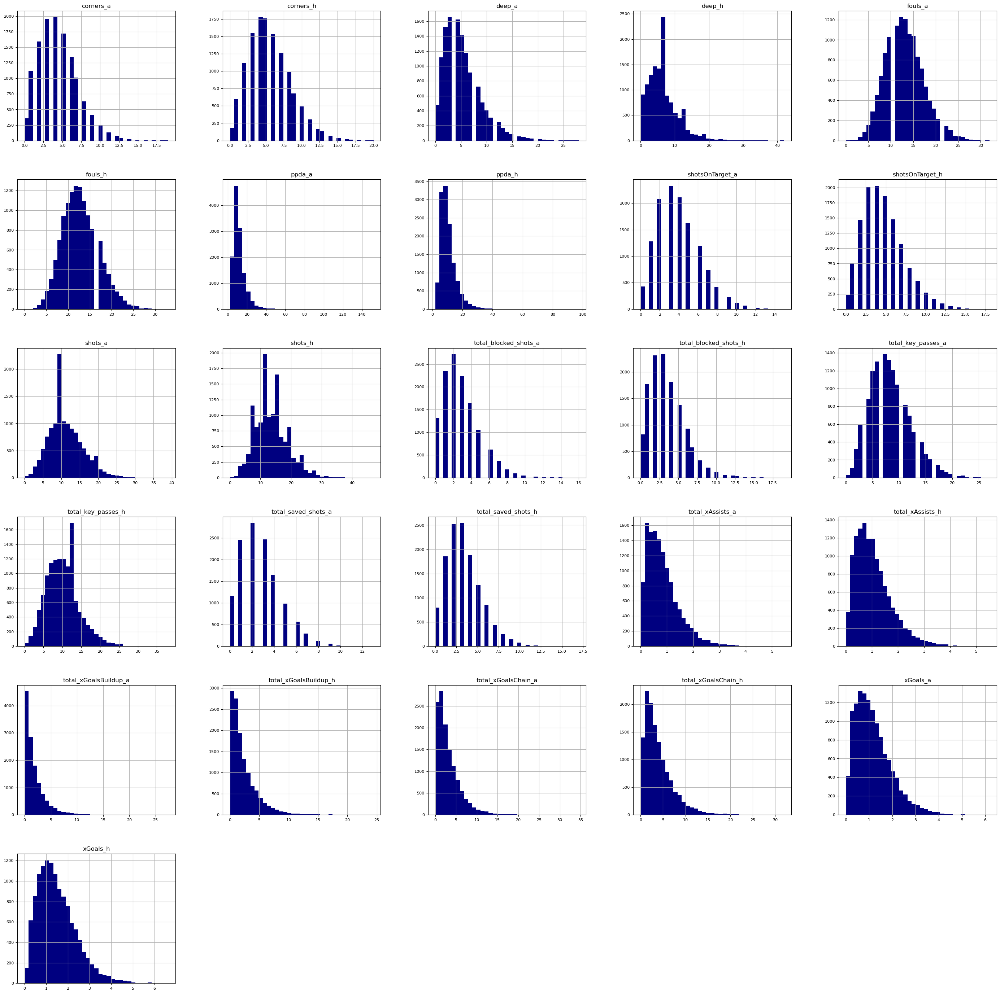

In [22]:
df[df_num].hist(figsize=(35, 35), bins=35, xlabelsize=8, ylabelsize=8, color = "navy");
plt.show()

In [24]:
import pandas as pd
from scipy.stats import normaltest

# Define the highlight function for styling
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    return default

# Numerical columns from df
df_num = df.select_dtypes(include='number').columns

# Calculate skewness
skew_df = pd.DataFrame(df[df_num].skew(), columns=['skewness'])
skew_df = skew_df.sort_values(by='skewness', ascending=False)

# Check for normality
normal = []
not_normal = []

for col in df_num:
    stat, p = normaltest(df[col].dropna())
    if p > 0.05:
        normal.append(col)
    else:
        not_normal.append(col)

# Display skewness with color highlighting
display(skew_df.style.applymap(highlight))

# Output lists of normal and not normal variables
print("✅ Normally Distributed Variables:")
print(normal)

print("\n❌ Not Normally Distributed Variables:")
print(not_normal)


,skewness
ppda_a,3.277596
ppda_h,2.602424
total_xGoalsBuildup_a,2.408524
total_xGoalsBuildup_h,2.191562
total_xGoalsChain_a,1.972202
total_xGoalsChain_h,1.819149
total_xAssists_a,1.388455
deep_h,1.358435
deep_a,1.282733
total_xAssists_h,1.226424


✅ Normally Distributed Variables:
[]

❌ Not Normally Distributed Variables:
['gameID', 'homeTeamID', 'awayTeamID', 'xGoals_h', 'shots_h', 'shotsOnTarget_h', 'deep_h', 'ppda_h', 'fouls_h', 'corners_h', 'total_xAssists_h', 'total_key_passes_h', 'total_xGoalsChain_h', 'total_xGoalsBuildup_h', 'total_blocked_shots_h', 'total_saved_shots_h', 'xGoals_a', 'shots_a', 'shotsOnTarget_a', 'deep_a', 'ppda_a', 'fouls_a', 'corners_a', 'total_xAssists_a', 'total_key_passes_a', 'total_xGoalsChain_a', 'total_xGoalsBuildup_a', 'total_blocked_shots_a', 'total_saved_shots_a']


In [25]:
import pandas as pd
from scipy.stats import normaltest

# Define highlight function for kurtosis values
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 4:
        return highlight
    elif cell_value < 2:
        return negative
    else:
        return default

# Numerical columns only
df_num = df.select_dtypes(include='number').columns

# Calculate kurtosis
kurtosis_df = pd.DataFrame(df[df_num].kurt(), columns=['Kurtosis'])
kurtosis_df = kurtosis_df.sort_values(by='Kurtosis', ascending=False)

# Check normality
normal = []
not_normal = []

for col in df_num:
    col_data = df[col].dropna()
    if len(col_data) >= 8:  # required minimum for normaltest
        stat, p = normaltest(col_data)
        if p > 0.05:
            normal.append(col)
        else:
            not_normal.append(col)
    else:
        not_normal.append(col)  # not enough data to test reliably

# Display kurtosis with highlighting
display(kurtosis_df.style.applymap(highlight))

# Output the normality classification
print("✅ Normally Distributed Variables:")
print(normal)

print("\n❌ Not Normally Distributed Variables:")
print(not_normal)


,Kurtosis
ppda_a,27.872046
ppda_h,15.802852
total_xGoalsBuildup_a,9.678273
total_xGoalsBuildup_h,7.510977
total_xGoalsChain_a,6.401820
total_xGoalsChain_h,5.227653
deep_h,3.136956
total_xAssists_a,2.824003
deep_a,2.431121
total_xAssists_h,2.140138


✅ Normally Distributed Variables:
[]

❌ Not Normally Distributed Variables:
['gameID', 'homeTeamID', 'awayTeamID', 'xGoals_h', 'shots_h', 'shotsOnTarget_h', 'deep_h', 'ppda_h', 'fouls_h', 'corners_h', 'total_xAssists_h', 'total_key_passes_h', 'total_xGoalsChain_h', 'total_xGoalsBuildup_h', 'total_blocked_shots_h', 'total_saved_shots_h', 'xGoals_a', 'shots_a', 'shotsOnTarget_a', 'deep_a', 'ppda_a', 'fouls_a', 'corners_a', 'total_xAssists_a', 'total_key_passes_a', 'total_xGoalsChain_a', 'total_xGoalsBuildup_a', 'total_blocked_shots_a', 'total_saved_shots_a']


#### most of my data is skewed the result from skewness and Kurtosis showed that  only 5 columns are close to Normal distribution(Kurtosis=3), 10 are The distribution has heavier tails than normal (Kurtosis>3) and all the rest are The distribution has lighter tails than normal (Kurtosis<3). we will see the outliers checks later

#### all of the columns are positive skewed (skewness > 0) 20 of them with right tail (skewness > 1)

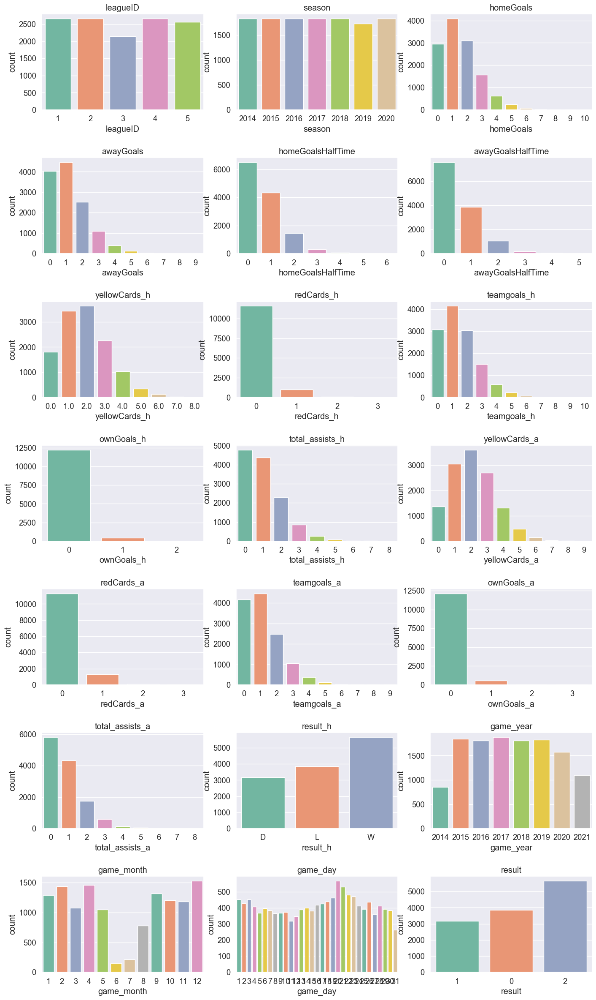

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

b = min(3, len(categorical_df.columns)) 
# Define number of rows and columns dynamically based on data
num_plots = len(categorical_df.columns)
rows = math.ceil(num_plots / b)  # Adjust rows dynamically

# Choose a color palette
palette_choice = "Set2"  

# Create figure
fig = plt.figure(figsize=(b * 5, rows * 4))  # Scale size dynamically
plt.subplots_adjust(hspace=0.5)
sns.set(font_scale=1.2)  

# Loop through categorical columns and plot
for i, col in enumerate(categorical_df.columns, 1):  
    plt.subplot(rows, b, i)
    plt.title(col)
    
    # Count plot with color palette
    sns.countplot(x=col, data=categorical_df, palette=palette_choice)  

plt.show()


### Distribution of the target variable

In [50]:
df['result_h'].value_counts()

result_h
W    5654
L    3854
D    3172
Name: count, dtype: int64

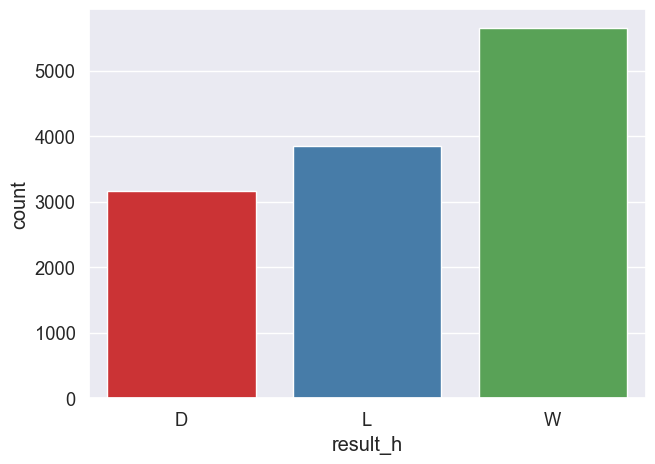

In [51]:
#fig, ax = plt.subplots(figsize=(20,5))
sns.countplot(x=df['result_h'].dropna(),data=df, palette="Set1")
plt.show()

#### most of the target results are for wining by the home team

## Correlation

### we will use spearman correlation since our data is not normal distribution

In [52]:
corr = df[df_num].corr(method = 'spearman')
corr.style.background_gradient(cmap='coolwarm')

,corners_a,corners_h,deep_a,deep_h,fouls_a,fouls_h,ppda_a,ppda_h,shotsOnTarget_a,shotsOnTarget_h,shots_a,shots_h,total_blocked_shots_a,total_blocked_shots_h,total_key_passes_a,total_key_passes_h,total_saved_shots_a,total_saved_shots_h,total_xAssists_a,total_xAssists_h,total_xGoalsBuildup_a,total_xGoalsBuildup_h,total_xGoalsChain_a,total_xGoalsChain_h,xGoals_a,xGoals_h
corners_a,1.000000,-0.234965,0.342717,-0.215366,-0.050981,-0.013621,-0.288000,0.244962,0.268869,-0.148992,0.475833,-0.263293,0.415698,-0.167432,0.439652,-0.241242,0.300191,-0.159717,0.252486,-0.133076,0.171512,-0.138033,0.178280,-0.133211,0.258913,-0.148225
corners_h,-0.234965,1.000000,-0.247406,0.367745,-0.038155,-0.097236,0.270337,-0.308924,-0.156448,0.284774,-0.270261,0.502022,-0.172609,0.420379,-0.249516,0.471925,-0.161806,0.333908,-0.158470,0.267748,-0.170428,0.189289,-0.160727,0.189505,-0.170886,0.254129
deep_a,0.342717,-0.247406,1.000000,-0.230418,-0.096287,-0.010494,-0.300159,0.369975,0.419911,-0.193742,0.554022,-0.284092,0.361719,-0.164025,0.566438,-0.268906,0.349723,-0.171414,0.517196,-0.199612,0.516915,-0.197077,0.533465,-0.193923,0.490142,-0.200643
deep_h,-0.215366,0.367745,-0.230418,1.000000,-0.076952,-0.141393,0.399245,-0.288527,-0.150753,0.418107,-0.249095,0.553946,-0.157964,0.365277,-0.231498,0.570200,-0.140832,0.353822,-0.163040,0.502796,-0.164685,0.504410,-0.159504,0.518184,-0.166742,0.475620
fouls_a,-0.050981,-0.038155,-0.096287,-0.076952,1.000000,0.202256,-0.339492,-0.213677,-0.059619,-0.034057,-0.069247,-0.030298,-0.043602,-0.032886,-0.081153,-0.069535,-0.056888,-0.018165,-0.072198,-0.073973,-0.106216,-0.109517,-0.091082,-0.111716,-0.049773,-0.036370
fouls_h,-0.013621,-0.097236,-0.010494,-0.141393,0.202256,1.000000,-0.239905,-0.262892,0.017408,-0.088755,0.025043,-0.131675,0.001880,-0.084942,-0.016599,-0.140194,0.019276,-0.059849,-0.006445,-0.113044,-0.032408,-0.143809,-0.029025,-0.133028,0.028875,-0.094158
ppda_a,-0.288000,0.270337,-0.300159,0.399245,-0.339492,-0.239905,1.000000,-0.188060,-0.173729,0.260832,-0.307295,0.371108,-0.217609,0.252492,-0.276124,0.374014,-0.179384,0.233437,-0.175852,0.254960,-0.159283,0.365130,-0.163613,0.328852,-0.184287,0.256575
ppda_h,0.244962,-0.308924,0.369975,-0.288527,-0.213677,-0.262892,-0.188060,1.000000,0.204663,-0.173062,0.332000,-0.315042,0.236243,-0.223701,0.330254,-0.277828,0.194573,-0.192002,0.213590,-0.160965,0.316622,-0.143694,0.279450,-0.144829,0.213297,-0.176584
shotsOnTarget_a,0.268869,-0.156448,0.419911,-0.150753,-0.059619,0.017408,-0.173729,0.204663,1.000000,-0.142617,0.652117,-0.180946,0.198939,-0.096252,0.608096,-0.176787,0.836928,-0.112817,0.586068,-0.155539,0.499806,-0.153820,0.566065,-0.158686,0.654017,-0.159565
shotsOnTarget_h,-0.148992,0.284774,-0.193742,0.418107,-0.034057,-0.088755,0.260832,-0.173062,-0.142617,1.000000,-0.194557,0.642636,-0.115887,0.189046,-0.188754,0.603954,-0.115577,0.838550,-0.175267,0.588458,-0.172387,0.496945,-0.178441,0.560903,-0.173102,0.660090


In [ ]:
def chi_square_test(df, col1, col2):
    """
    Perform a Chi-Square test for independence between two categorical columns.
    """
    contingency_table = pd.crosstab(df[col1], df[col2])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    return {"Chi2 Statistic": chi2, "p-value": p}

def t_test(df, numerical_col, categorical_col, group1, group2):
    """
    Perform a T-Test between two groups of a categorical variable on a numerical variable.
    """
    group1_data = df[df[categorical_col] == group1][numerical_col]
    group2_data = df[df[categorical_col] == group2][numerical_col]
    group3_data = df[df[categorical_col] == group3][numerical_col]
    t_stat, p_value = ttest_ind(group1_data, group2_data,group3_data, equal_var=False)
    return {"T-Statistic": t_stat, "p-value": p_value}

In [54]:
# Define Chi-Square test function
def chi_square_tests(df, target_col, categorical_cols):
    """
    Perform Chi-Square tests for independence between a target categorical column 
    and multiple categorical columns.

    Parameters:
    - df: pandas DataFrame
    - target_col: The target categorical column to compare against
    - categorical_cols: List of categorical columns to test

    Returns:
    - DataFrame with Chi-Square statistic and p-value for each test
    """
    results = []

    for col in categorical_cols:
        if col != target_col:  # Avoid testing the column against itself
            contingency_table = pd.crosstab(df[target_col], df[col])
            chi2, p, _, _ = chi2_contingency(contingency_table)
            results.append({"Category": col, "Chi2 Statistic": chi2, "p-value": p})

    return pd.DataFrame(results)

# Identify categorical columns (excluding the target column)
categorical_columns = categorical_df.columns.tolist()
target_column = "result_h"  # Assuming 'result_h' is the target column

# Run Chi-Square tests on all categorical variables
chi_square_results = chi_square_tests(categorical_df, target_column, categorical_columns)
chi_square_results

,Category,Chi2 Statistic,p-value
0,leagueID,10.269471,2.466197e-01
1,season,38.107108,1.474900e-04
2,homeGoals,6442.602264,0.000000e+00
3,awayGoals,6075.093708,0.000000e+00
4,homeGoalsHalfTime,2545.653402,0.000000e+00
5,awayGoalsHalfTime,2532.813172,0.000000e+00
6,yellowCards_h,204.061606,1.196222e-34
7,redCards_h,218.341445,2.349069e-44
8,teamgoals_h,6231.085197,0.000000e+00
9,ownGoals_h,142.809203,7.065481e-30


In [56]:
from scipy.stats import f_oneway, ttest_ind

def perform_anova(df, categorical_col):
    """
    Perform ANOVA test for all numerical columns against a categorical variable.
    
    Parameters:
    - df: pandas DataFrame
    - categorical_col: The categorical column to compare against (e.g., 'result_h')
    
    Returns:
    - DataFrame containing ANOVA results (F-statistic and p-value) for each numerical column
    """
    numerical_cols = df.select_dtypes(include=[np.number]).columns
    results = []

    for col in numerical_cols:
        groups = [df[df[categorical_col] == group][col].dropna() for group in df[categorical_col].unique()]
        
        if len(groups) > 1:
            f_stat, p_value = f_oneway(*groups)
            results.append({"Numerical Feature": col, "F-Statistic": f_stat, "p-value": p_value})

    return pd.DataFrame(results)


def perform_t_tests(df, categorical_col):
    """
    Perform pairwise T-Tests for all numerical columns against a categorical variable with three groups.
    
    Parameters:
    - df: pandas DataFrame
    - categorical_col: The categorical column to compare against (e.g., 'result_h')
    
    Returns:
    - DataFrame containing T-test results for each numerical column between each pair of groups.
    """
    numerical_cols = df.select_dtypes(include=[np.number]).columns
    groups = df[categorical_col].unique()
    results = []

    for col in numerical_cols:
        for i in range(len(groups)):
            for j in range(i + 1, len(groups)):
                group1 = df[df[categorical_col] == groups[i]][col].dropna()
                group2 = df[df[categorical_col] == groups[j]][col].dropna()

                t_stat, p_value = ttest_ind(group1, group2, equal_var=False)
                results.append({
                    "Numerical Feature": col,
                    "Group 1": groups[i],
                    "Group 2": groups[j],
                    "T-Statistic": t_stat,
                    "p-value": p_value
                })

    return pd.DataFrame(results)


# Run ANOVA for all numerical columns
anova_results = perform_anova(df, "result_h")

# Run T-Tests for pairwise comparisons
t_test_results = perform_t_tests(df, "result_h")




In [61]:
anova_results

,Numerical Feature,F-Statistic,p-value
0,gameID,9.266700,9.516170e-05
1,homeTeamID,33.335962,3.633404e-15
2,awayTeamID,39.899400,5.323790e-18
3,xGoals_h,1547.497095,0.000000e+00
4,shots_h,220.789503,5.553579e-95
5,shotsOnTarget_h,1279.749618,0.000000e+00
6,deep_h,224.149257,2.162351e-96
7,ppda_h,55.980296,6.234437e-25
8,fouls_h,22.570886,1.640591e-10
9,corners_h,11.314631,1.231682e-05


In [31]:
# need to do chisquer 
# T test analysis

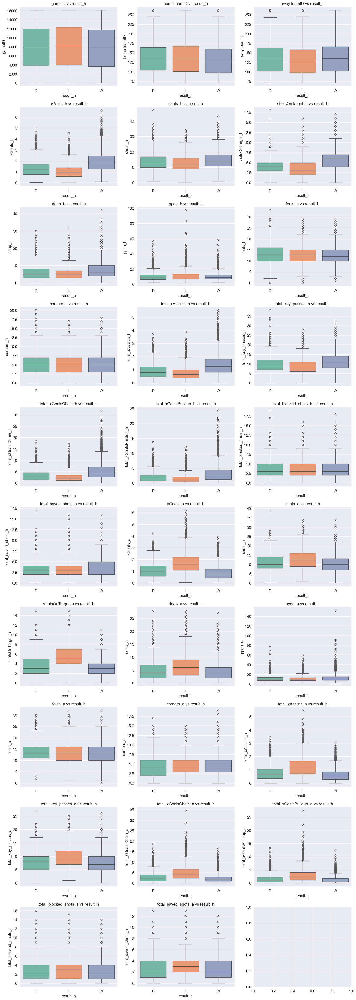

In [62]:
# Re-load necessary libraries after execution state reset
#import pandas as pd
#import numpy as np
#import seaborn as sns
#import matplotlib.pyplot as plt
#import math

# Define function to plot ANOVA results
def plot_anova_results(df, categorical_col):
    """
    Create boxplots to visualize ANOVA results.
    
    Parameters:
    - df: pandas DataFrame
    - categorical_col: The categorical column (e.g., 'result_h') to compare numeric features against.
    """
    numerical_cols = df.select_dtypes(include=[np.number]).columns
    num_plots = len(numerical_cols)
    rows = math.ceil(num_plots / 3)  # Arrange in 3 columns

    fig, axes = plt.subplots(rows, 3, figsize=(18, rows * 5))
    axes = axes.flatten()  # Flatten axes for easier indexing

    for i, col in enumerate(numerical_cols):
        sns.boxplot(x=df[categorical_col], y=df[col], palette="Set2", ax=axes[i])
        axes[i].set_title(f"{col} vs {categorical_col}")
        axes[i].set_xlabel(categorical_col)
        axes[i].set_ylabel(col)

    plt.tight_layout()
    plt.show()

# Generate ANOVA visualizations
plot_anova_results(df, "result_h")


In [ ]:
Exploratory Data Analysis (EDA) Report – Football Match Data
1. Data Overview
The dataset contains 12,680 matches with 50 features related to team performance, disciplinary actions, and match results.
Categorical variables with fewer than 10 unique values were converted to the category type.
No duplicate rows were found, but some columns had missing values.
2. Descriptive Analysis
Skewness & Kurtosis: Most features are skewed, with only 5 columns close to normal distribution.
Histograms & Boxplots: homeGoals, awayGoals, and xGoals_h show distinct distributions for match outcomes.
3. Correlation & Statistical Tests
Correlation Analysis:
xGoals_h, teamgoals_h, and total_assists_h have strong positive correlations with match results.
Chi-Square Test: Red cards (redCards_h, redCards_a) significantly impact match outcomes (p < 0.001).
T-Test & ANOVA:
Expected goals (xGoals_h) are significantly higher in wins compared to losses (p < 0.001).
Shots (shots_h) show different distributions between wins and losses (p < 0.001, Kolmogorov-Smirnov test).
4. Key Insights
Performance Metrics Drive Results: Goals, assists, and expected goals are strong predictors of match outcomes.
Disciplinary Factors Matter: More red cards correlate with increased losses.
Time-Based Trends: Results vary significantly by season and game year.